# **Taller 2 - Ciencia de datos aplicada**
## **Regresión**

* Kevin Infante Hernández

## **Problema**
Desarrollar un modelo altamente interpretable usando como entrada el siguiente conjunto de [datos](https://drive.google.com/file/d/1zsFX4PUehK_rmLtP-1hqPnSo86VMHDAm/view) que permita encontrar las variables con mayor influencia en la predicción del PIB de los paises. Se cuenta con el [diccionario de datos](https://drive.google.com/file/d/12kCZLW8i9a4YzNNdCTAU5SSjIEIyTMWs/view).

## **Objetivos**
*   Crear un modelo de regresión altamente interpretable que permita predecir el PIB de los paises.
*   Realizar un análisis estadístico y gráfico univariado y multivariado sobre el set de datos de entrada.
*   Encontrar las variables que tienen mayor influencia sobre el PIB de los paises, de modo que se puedan realizar recomendaciones de qué políticas públicas deberían implementar los países para mejorar su PIB.



### 0. Importación de paquetes

In [149]:
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Configuración de pandas para expandir el número de filas y columnas por defecto a mostrar
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)

# Cambiar el formato en el que se muestran los valores float
pd.set_option('display.float_format', lambda x: '%.5f' % x)
import scipy.stats as stats

from ydata_profiling import ProfileReport

### 1. Entendimiento de datos

Se procede con el cargue de información

In [150]:
pib_df = pd.read_csv("./data/gapminder_final.csv")

El Dataset cuenta con registros de 178 paises y 16 atributos

In [151]:
pib_df.shape

(178, 16)

In [152]:
dataset_size = pib_df.shape[0]

Muestra de los datos

In [153]:
pib_df.sample(5)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
115,Nepal,268.25945,2.42000,1.01273,21.80000,52657000.00000,54.60000,0.40000,7.93010,68.79500,NaN,6.00000,31.54456,11.65521,61.80000,17.24000
101,Egypt,1975.55191,0.32000,3.29081,24.20000,3341129000.00000,18.20000,0.06000,26.74003,73.23500,0.44748,-3.00000,536.76045,1.79990,42.40000,42.72000
114,Tajikistan,279.18045,3.39000,0.60487,13.20000,104170000.00000,50.10000,0.20000,11.54939,67.52900,NaN,-3.00000,405.77539,2.64898,54.60000,26.46000
84,Venezuela,5528.36311,7.60000,0.90402,34.30000,5418886000.00000,45.80000,NaN,35.85044,74.40200,1.21464,-3.00000,969.00434,4.11962,59.90000,93.32000
1,Albania,1914.99655,7.29000,1.02474,57.40000,223747333.30000,42.10000,NaN,44.98995,76.91800,NaN,9.00000,636.34138,7.69933,51.40000,46.72000


Se ve que Pandas logró identificar todas las columnas como de tipo numérico, excepto "Country", que es el nombre del país

In [154]:
pib_df.dtypes

country                  object
incomeperperson         float64
alcconsumption          float64
armedforcesrate         float64
breastcancerper100th    float64
co2emissions            float64
femaleemployrate        float64
hivrate                 float64
internetuserate         float64
lifeexpectancy          float64
oilperperson            float64
polityscore             float64
relectricperperson      float64
suicideper100th         float64
employrate              float64
urbanrate               float64
dtype: object

A continuación se listan los atributos que se consideran más importantes para este análisis:
* country (Nombre del país)
* incomeperperson (PIB - Variable objetivo)
* polityScore (Puntaje de nivel de democracia en 2009. -10 es el puntaje más bajo, 10 es el puntaje más alto)
* employrate (Porcentaje de la población mayor de 15 años empleada)
* lifeExpectancy (Expectativa de vida en años)


### 2. Análisis univariado

Se genera el Profile Report para obtener un primer vistazo de las variables

In [155]:
profile = ProfileReport(pib_df)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##### País (country)

Listado de paises

In [156]:
pib_df["country"].unique()

array(['Ireland', 'Albania', 'Central African Rep.', 'Barbados', 'Italy',
       'Switzerland', 'Mauritania', 'Oman', 'Tanzania', 'Thailand',
       'Haiti', 'Equatorial Guinea', 'Guatemala', 'Iraq', 'Mali',
       'Bolivia', 'Kenya', 'Panama', 'Macedonia, FYR', 'Austria', 'Fiji',
       'Cuba', 'Azerbaijan', 'Korea, Rep.', 'Nicaragua', 'Lithuania',
       'Saudi Arabia', 'Belarus', 'Lesotho', 'Cape Verde', 'Eritrea',
       'Uganda', 'South Africa', 'Gabon', 'Georgia', 'Estonia',
       'Argentina', 'Cambodia', 'Suriname', 'Gambia', 'Japan',
       'Mozambique', 'Norway', 'Angola', 'Yemen, Rep.', 'Armenia',
       'Costa Rica', 'Turkey', 'Moldova', 'Pakistan', 'Vietnam', 'Spain',
       'Syria', 'Uzbekistan', 'Swaziland', 'Croatia', 'Solomon Islands',
       'Ghana', 'Finland', 'Senegal', 'Bangladesh', 'Guyana', 'Ethiopia',
       'Russia', 'Israel', 'Malaysia', 'Kuwait', 'Malta', 'Ecuador',
       'Mongolia', 'Kyrgyzstan', 'Germany', 'Rwanda', 'China', 'Burundi',
       'Slovak Repub

Se ve que se tienen 166 registros únicos de países a pesar de que el Dataset consta de 178 registros, lo cual muestra que existen registros repetidos

In [157]:
pib_df["country"].nunique()

166

Número de registros que no tienen país, en caso de que los hayan

In [158]:
(pib_df['country'].values == '').sum()

0

A continuación se muestran los paises que están repetidos, y se ve que todas las demás columnas están repetidas también

In [159]:
duplicates_by_country = pib_df.loc[pib_df["country"].duplicated(keep=False)]
duplicates_by_country.sort_values("country", ascending=True)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
148,Belarus,2737.67038,18.85000,3.71193,36.00000,999874333.30000,48.60000,0.30000,32.05214,70.34900,0.68783,-7.00000,614.90729,26.87469,53.40000,73.46000
27,Belarus,2737.67038,18.85000,3.71193,36.00000,999874333.30000,48.60000,0.30000,32.05214,70.34900,0.68783,-7.00000,614.90729,26.87469,53.40000,73.46000
124,Iran,2161.54651,1.03000,2.02640,17.10000,9183548000.00000,26.90000,0.20000,13.00011,72.97400,1.16258,-7.00000,753.20980,6.02188,47.80000,68.46000
116,Iran,2161.54651,1.03000,2.02640,17.10000,9183548000.00000,26.90000,0.20000,13.00011,72.97400,1.16258,-7.00000,753.20980,6.02188,47.80000,68.46000
0,Ireland,27595.09135,14.92000,0.45002,74.90000,1633778667.00000,51.00000,0.20000,69.77039,80.55700,1.70026,10.00000,2051.80234,10.36507,59.90000,61.34000
155,Ireland,27595.09135,14.92000,0.45002,74.90000,1633778667.00000,51.00000,0.20000,69.77039,80.55700,1.70026,10.00000,2051.80234,10.36507,59.90000,61.34000
143,Lithuania,5332.23859,16.30000,1.48783,38.50000,226255333.30000,48.80000,0.10000,62.81190,72.23100,0.81237,10.00000,758.85872,33.34186,53.10000,66.96000
25,Lithuania,5332.23859,16.30000,1.48783,38.50000,226255333.30000,48.80000,0.10000,62.81190,72.23100,0.81237,10.00000,758.85872,33.34186,53.10000,66.96000
97,Luxembourg,52301.58718,12.84000,0.73134,82.50000,592012666.70000,45.90000,0.30000,90.07953,79.96300,NaN,NaN,1566.10614,12.40592,53.50000,82.44000
166,Luxembourg,52301.58718,12.84000,0.73134,82.50000,592012666.70000,45.90000,0.30000,90.07953,79.96300,NaN,NaN,1566.10614,12.40592,53.50000,82.44000


##### PIB (incomeperperson)

Es la variable objetivo, y corresponde al producto interno bruto per cápita en unidades de 2,000 USD.

**Datos estadisticos básicos y distribución de los datos**

**Análisis de pareto PIB**

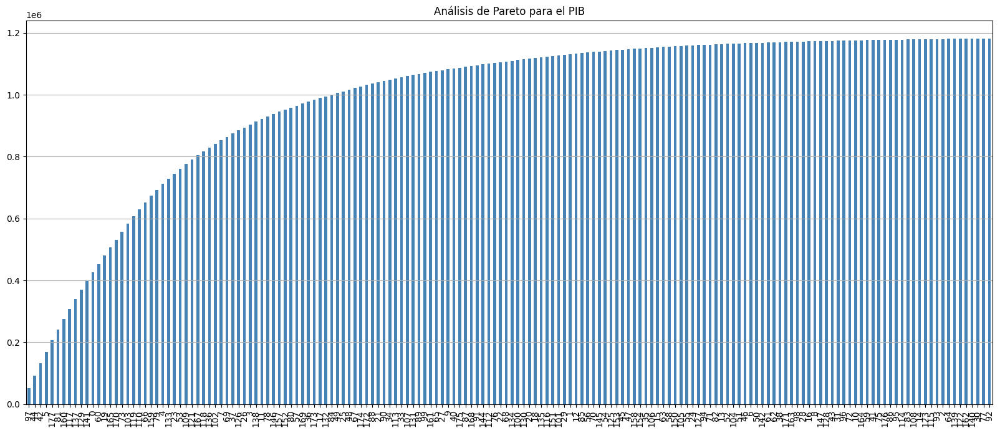

In [265]:
pib_frec_cumsum = pib_df["incomeperperson"].sort_values(ascending=False).cumsum()

plt.figure(figsize=(20, 8))
pib_frec_cumsum.plot(kind="bar", color="steelblue")
plt.title("Análisis de Pareto para el PIB")
plt.grid(axis="y")
plt.show()

El PIB de 29 de los 178 paises presentes en el dataset representa el 80% del total de PIB en el mundo, es decir, el 16% de los paises tienen el 80% del PIB producido por todo el mundo.

In [257]:
pib_df["incomeperperson"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.8, 0.95])

count     166.00000
mean     7114.23979
std     10393.96488
min       103.77586
5%        240.30845
25%       609.43775
50%      2344.89692
75%      8305.51203
80%     11191.81101
95%     31852.43150
max     52301.58718
Name: incomeperperson, dtype: float64

[]

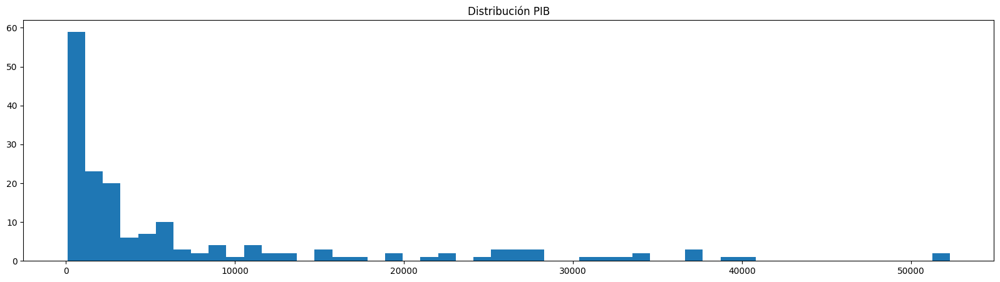

In [161]:
plt.figure(figsize=(20, 5))
plt.hist(pib_df["incomeperperson"],bins=50)
plt.title("Distribución PIB")
plt.plot()

Los estadísticos básicos y el histograma muestra que la distribución de los datos es inclinada hacia la izquierda, no normal, y que el 75% de los paises tiene un PIB inferior a 8,000 unidades de 2,000 USD.

**Número de nulos**

In [162]:
incomePerson_nan_count = pib_df["incomeperperson"].isna().sum()
print("Número de nulos:",incomePerson_nan_count)
print("Porcentaje de nulos: {}%".format((incomePerson_nan_count/dataset_size)*100))

Número de nulos: 3
Porcentaje de nulos: 1.6853932584269662%


**Visualización de registros con valores nulos**

In [163]:
income_person_nan = pib_df.loc[pib_df["incomeperperson"].isna()]
income_person_nan

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
68,Kuwait,NaN,0.10000,1.60955,31.80000,1712755000.00000,42.00000,NaN,38.26023,74.57600,6.46757,-7.00000,8362.56798,1.49806,65.70000,98.36000
100,Afghanistan,NaN,0.03000,0.56965,26.80000,75944000.00000,25.60000,NaN,3.65412,48.67300,NaN,0.00000,NaN,6.68439,55.70000,24.04000
134,Myanmar,NaN,0.58000,1.91297,20.20000,322960000.00000,66.50000,0.60000,NaN,65.19300,NaN,-6.00000,38.00564,10.11500,74.70000,32.58000


No se encuentra una cantidad importante de nulos, y los registros con esta columna nula tienen la mayoría del resto de columnas con información, lo cual descarta que sean registros basura.

**Boxplot para encontrar Outliers**

Se descartan los registros en N/A para poder mostrar el Boxsplot

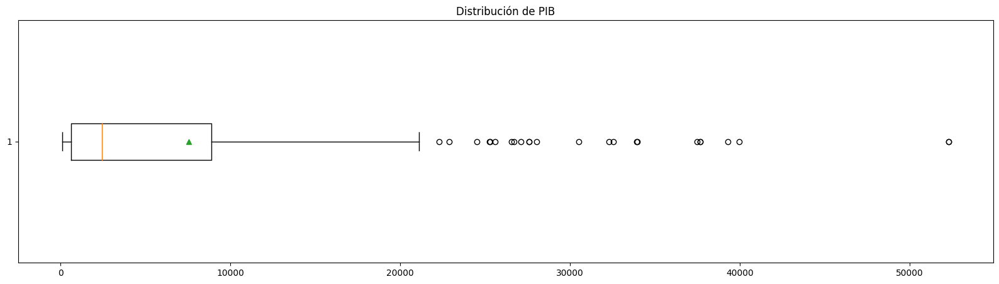

In [164]:
plt.figure(figsize=(20, 5))
plt.boxplot(pib_df["incomeperperson"].loc[~pib_df["incomeperperson"].isna()], showmeans=True, vert=False)
plt.title("Distribución de PIB")
plt.show()

Se encuentra una proporción importante de paises cuyo valor supera el rango intercuartilico. Al ser tantos, no se deben descartar.

**Paises con mayores ingresos**

In [165]:
print(pib_df.sort_values(by=["incomeperperson"],ascending=False).head(7)[["country","incomeperperson"]])

           country  incomeperperson
166     Luxembourg      52301.58718
97      Luxembourg      52301.58718
44          Norway      39972.35277
42           Japan      39309.47886
32     Switzerland      37662.75125
5      Switzerland      37662.75125
177  United States      37491.17952


Se ve que hay registros repetidos, y el PIB de los paises con mayor PIB triplica o hasta es 5 veces mayor que el del 75% de los demás paises.

**Paises con menores ingresos**

In [166]:
print(pib_df.sort_values(by=["incomeperperson"],ascending=True).head(7)[["country","incomeperperson"]])

              country  incomeperperson
92   Congo, Dem. Rep.        103.77586
77            Burundi        115.30600
30            Eritrea        131.79621
140           Liberia        155.03323
162     Guinea-Bissau        161.31714
122             Niger        180.08338
139            Malawi        184.14180


La mayoría de los paises con menor PIB se ubican en África, y su PIB no es ni siquiera el 1% del PIB de los paises con mayor PIB en el mundo.

##### Puntaje de nivel de democracia (polityscore)
Puntaje de nivel de democracia. Los posibles valores varían desde -10 (antidemocrático) hasta 10 (democrático).

**Datos estadisticos básicos y distribución de los datos**

In [167]:
pib_df["polityscore"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count   167.00000
mean      3.50299
std       6.42367
min     -10.00000
5%       -7.00000
25%      -2.50000
50%       6.00000
75%       9.00000
95%      10.00000
max      10.00000
Name: polityscore, dtype: float64

[]

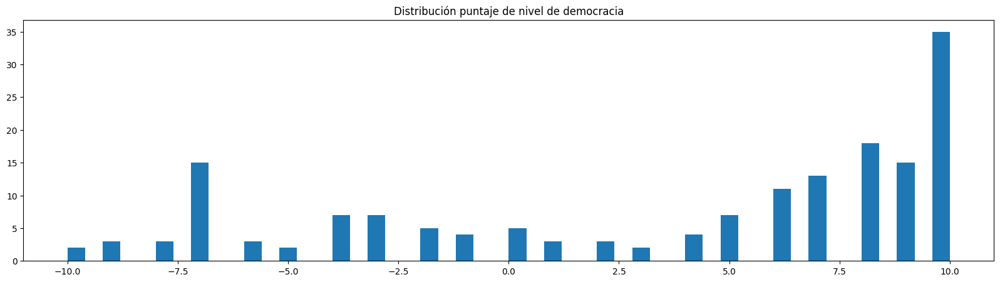

In [168]:
plt.figure(figsize=(20, 5))
plt.hist(pib_df["polityscore"],bins=50)
plt.title("Distribución puntaje de nivel de democracia")
plt.plot()

Los datos estadísticos básicos muestran que todos los valores se encuentran en el rango esperado, y son más los paises con puntajes de democracia positivos que paises con puntajes de democracia negativos.

**Número de nulos**

In [169]:
nan_count = pib_df["polityscore"].isna().sum()
print("Número de nulos", nan_count)
print("Porcentaje de nulos: {}%".format((nan_count/dataset_size)*100))

Número de nulos 11
Porcentaje de nulos: 6.179775280898876%


**Visualización de registros con valores nulos**

In [170]:
income_person_nan = pib_df.loc[pib_df["polityscore"].isna()]
income_person_nan

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
3,Barbados,9243.58705,6.42000,0.66396,62.50000,36160666.67000,60.30000,1.40000,70.02860,76.83500,NaN,NaN,NaN,3.10860,66.90000,39.84000
29,Cape Verde,1959.84447,4.98000,0.48332,28.10000,5214000.00000,43.60000,NaN,29.99994,74.15600,NaN,NaN,NaN,5.63333,55.90000,59.62000
40,Suriname,2668.02052,6.56000,1.05842,30.00000,86317000.00000,30.40000,1.00000,31.56810,70.56300,NaN,NaN,NaN,20.74743,44.70000,74.92000
69,Malta,11066.78414,4.10000,1.14432,76.10000,73784333.33000,30.10000,0.10000,63.07799,79.63400,NaN,NaN,1598.67396,4.55112,46.80000,94.26000
79,Bahamas,19630.54055,8.65000,0.54529,54.40000,137555000.00000,60.70000,3.10000,42.98458,75.62000,NaN,NaN,NaN,3.37442,66.60000,83.70000
81,Iceland,33945.31442,7.38000,0.06610,90.00000,92770333.33000,69.60000,0.30000,95.63811,81.80400,NaN,NaN,2826.04487,11.42618,73.60000,92.26000
97,Luxembourg,52301.58718,12.84000,0.73134,82.50000,592012666.70000,45.90000,0.30000,90.07953,79.96300,NaN,NaN,1566.10614,12.40592,53.50000,82.44000
131,Belize,3545.65217,5.92000,0.75836,29.80000,14058000.00000,38.80000,2.30000,12.64573,76.07200,NaN,NaN,NaN,9.38880,56.80000,51.70000
133,Brunei,17092.46000,1.86000,4.68399,20.60000,254206333.30000,55.50000,NaN,49.98997,78.00500,NaN,NaN,3067.49890,1.37000,63.80000,74.82000
135,Bosnia and Herzegovina,2183.34487,9.60000,0.46285,58.90000,236419333.30000,34.90000,NaN,52.00206,75.67000,NaN,NaN,927.11950,11.83672,41.20000,47.44000


Se observa un mayor porcentaje de registros nulos en este campo, pero este número sigue sin considerarse significativo. Ya que se tienen llenas la mayoría de las demás columnas, se concluye que estos registros no son basura.

**Boxplot para encontrar Outliers** 

Se descartan los registros en N/A para poder mostrar el Boxsplot

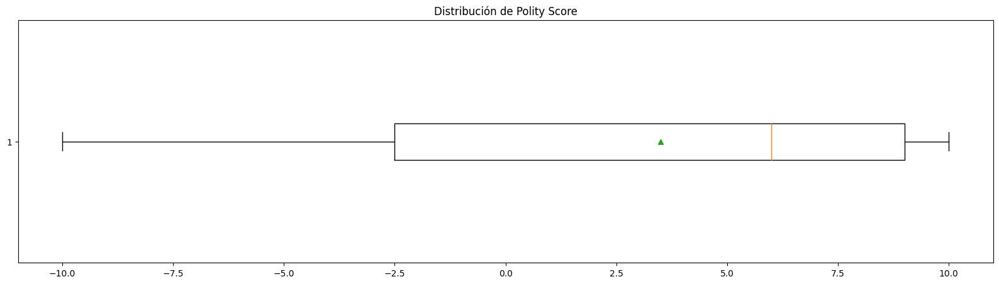

In [171]:
plt.figure(figsize=(20, 5))
plt.boxplot(pib_df["polityscore"].loc[~pib_df["polityscore"].isna()], showmeans=True, vert=False)
plt.title("Distribución de Polity Score")
plt.show()

Ya que todos los valores se encuentran dentro del dominio de valores, no se observan outliers

**Paises con mayor puntaje de nivel de democracia**

In [172]:
print(pib_df.sort_values(by=["polityscore"],ascending=False).head(7)[["country","polityscore"]])

        country  polityscore
0       Ireland     10.00000
32  Switzerland     10.00000
44       Norway     10.00000
48   Costa Rica     10.00000
53        Spain     10.00000
60      Finland     10.00000
66       Israel     10.00000


La mayoría de paises con mayor nivel de democracia son Europeos

**Paises con menor puntaje de nivel de democracia**

In [173]:
print(pib_df.sort_values(by=["polityscore"],ascending=True).head(7)[["country","polityscore"]])

          country  polityscore
26   Saudi Arabia    -10.00000
160         Qatar    -10.00000
56      Swaziland     -9.00000
55     Uzbekistan     -9.00000
151  Turkmenistan     -9.00000
7            Oman     -8.00000
39           Oman     -8.00000


Se ve que los paises considerados más antidemocráticos son monarquías absolutas.

##### Porcentaje de población empleada (employrate)

Proporción de personas mayores de 15 años con empleo sobre el total de la población del país.

**Datos estadisticos básicos y distribución de los datos**

In [174]:
pib_df["employrate"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count   177.00000
mean     58.85424
std      10.33480
min      34.90000
5%       41.92000
25%      51.40000
50%      58.80000
75%      65.00000
95%      78.20000
max      83.20000
Name: employrate, dtype: float64

[]

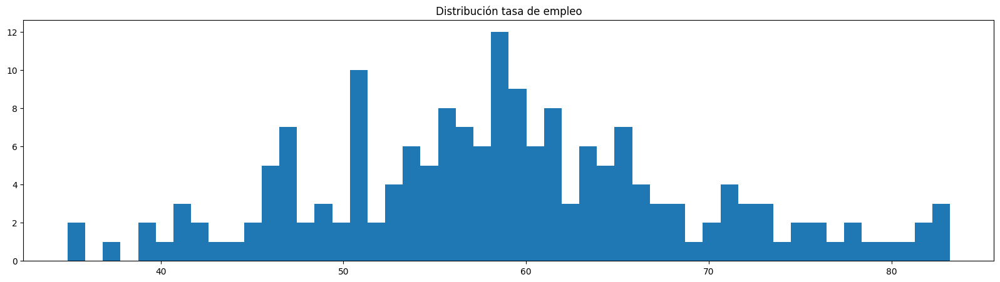

In [175]:
plt.figure(figsize=(20, 5))
plt.hist(pib_df["employrate"],bins=50)
plt.title("Distribución tasa de empleo")
plt.plot()

Se ve una distribución de los datos un poco inclinada hacia la derecha, siendo que la mayotía de paises tienen entre un 50 y 60% de porcentaje de población empleada. El valor mínimo de este porcentaje es 34.9%, y el máximo 83.2%, es decir, no se detectan valores atipicos del porcentaje de población empleada.

**Número de nulos**

In [176]:
nan_count = pib_df["employrate"].isna().sum()
print("Número de nulos", nan_count)
print("Porcentaje de nulos: {}%".format((nan_count/dataset_size)*100))

Número de nulos 1
Porcentaje de nulos: 0.5617977528089888%


**Visualización de registros con valores nulos**

In [177]:
income_person_nan = pib_df.loc[pib_df["employrate"].isna()]
income_person_nan

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
127,Djibouti,895.31834,1.87000,3.45155,19.50000,14054333.33000,NaN,2.50000,6.49792,57.93700,NaN,2.00000,NaN,4.99348,NaN,87.30000


No se observa un número significativo de registros nulos

**Boxplot para encontrar Outliers**

Se descartan los registros en N/A para poder mostrar el Boxsplot

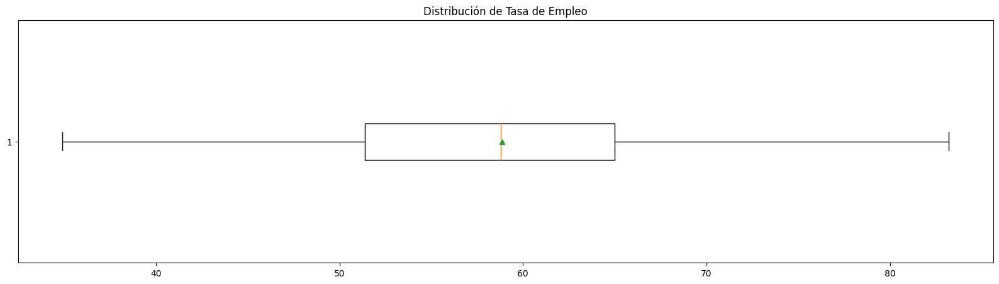

In [178]:
plt.figure(figsize=(20, 5))
plt.boxplot(pib_df["employrate"].loc[~pib_df["employrate"].isna()], showmeans=True, vert=False)
plt.title("Distribución de Tasa de Empleo")
plt.show()

La mediana y la media coinciden, lo cual confirma que la distribución de esta variable es ciertamente normal.

**Paises con mayor tasa de empleo**

In [179]:
print(pib_df.sort_values(by=["employrate"],ascending=False).head(7)[["country","employrate"]])

          country  employrate
77        Burundi    83.20000
31         Uganda    83.20000
93     Madagascar    83.00000
128        Guinea    81.50000
83   Burkina Faso    81.30000
64       Ethiopia    80.70000
75         Rwanda    79.80000


Se esperaría encontrar países del llamado "primer mundo" en esta lista, sin embargo, se encuentran paises en desarrollo y muchos de ellos en África. Probablemente se deba a que su población no es muy grande, sin embargo, es un dato que podría ser interesante de analizar.

**Paises con menor tasa de empleo**

In [180]:
print(pib_df.sort_values(by=["employrate"],ascending=True).head(7)[["country","employrate"]])

            country  employrate
18   Macedonia, FYR    34.90000
74   Macedonia, FYR    34.90000
13             Iraq    37.40000
144          Jordan    38.90000
46      Yemen, Rep.    39.00000
47          Armenia    40.10000
33     South Africa    41.10000


Se encuentran principalmente paises del medio oriente.

##### Expectativa de vida en años (lifeexpectancy)

**Datos estadisticos básicos y distribución de los datos**

In [181]:
pib_df["lifeexpectancy"].describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95])

count   178.00000
mean     69.41495
std       9.80833
min      47.79400
5%       50.13610
25%      62.72500
50%      72.97400
75%      76.12750
95%      81.40925
max      83.39400
Name: lifeexpectancy, dtype: float64

[]

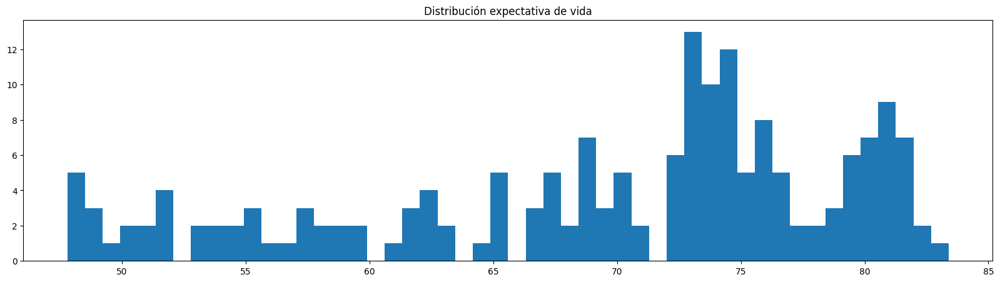

In [182]:
plt.figure(figsize=(20, 5))
plt.hist(pib_df["lifeexpectancy"],bins=50)
plt.title("Distribución expectativa de vida")
plt.plot()

La distribución está sesgada hacia la derecha, donde el 50% de los paises tiene una expectativa de vida igual o menor a 72.97 años. Los valores mínimos y máximos muestran que los valores se encuentran dentro del dominio esperado.

**Número de nulos**

In [183]:
nan_count = pib_df["lifeexpectancy"].isna().sum()
print("Número de nulos:", nan_count)

Número de nulos: 0


No hay registros nulos

**Boxplot para encontrar Outliers**

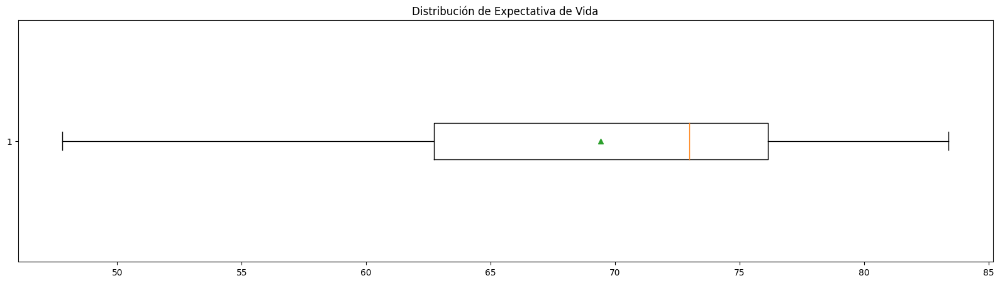

In [184]:
plt.figure(figsize=(20, 5))
plt.boxplot(pib_df["lifeexpectancy"].loc[~pib_df["lifeexpectancy"].isna()], showmeans=True, vert=False)
plt.title("Distribución de Expectativa de Vida")
plt.show()

En este gráfico se muestra que no hay valores atípicos y se ve el sesgo hacia la derecha.

**Paises con mayor expectativa de vida**

In [185]:
print(pib_df.sort_values(by=["lifeexpectancy"],ascending=False).head(7)[["country","lifeexpectancy"]])

         country  lifeexpectancy
42         Japan        83.39400
32   Switzerland        82.33800
5    Switzerland        82.33800
103    Australia        81.90700
4          Italy        81.85500
81       Iceland        81.80400
66        Israel        81.61800


Tal como se espera, en este top aparecen principalmente paises del llamado "primer mundo".

**Paises con menor expectativa de vida**

In [186]:
print(pib_df.sort_values(by=["lifeexpectancy"],ascending=True).head(7)[["country","lifeexpectancy"]])

                  country  lifeexpectancy
123          Sierra Leone        47.79400
162         Guinea-Bissau        48.13200
28                Lesotho        48.19600
92       Congo, Dem. Rep.        48.39700
2    Central African Rep.        48.39800
100           Afghanistan        48.67300
56              Swaziland        48.71800


Aparecen principalmente paises en vía de desarrollo, y ubicados en África.

### 3. Análisis bivariado

A continuación se analiza gráficamente la relación de la variable objetivo con las demás variables, esto para elegir las mejores variables ya que uno de los supuestos de la regresión lineal es que debe haber una relación lineal entre la variable objetivo y las variables que hagan parte del modelo

In [187]:
features = list(pib_df.columns)
features.remove('country')
features.remove('incomeperperson')
features

['alcconsumption',
 'armedforcesrate',
 'breastcancerper100th',
 'co2emissions',
 'femaleemployrate',
 'hivrate',
 'internetuserate',
 'lifeexpectancy',
 'oilperperson',
 'polityscore',
 'relectricperperson',
 'suicideper100th',
 'employrate',
 'urbanrate']

Se analizan todas las variables, dividiendolas en grupos de 7 para una visualización más fácil

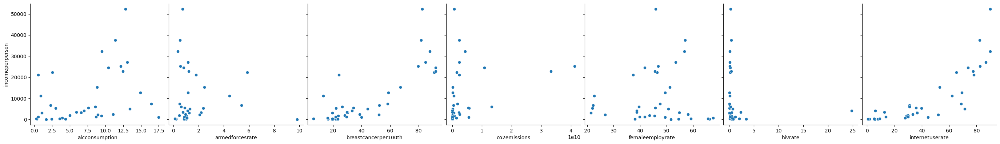

In [188]:
sns.pairplot(pib_df.sample(frac=0.2), height=4, y_vars="incomeperperson", x_vars=features[:7], kind="scatter")

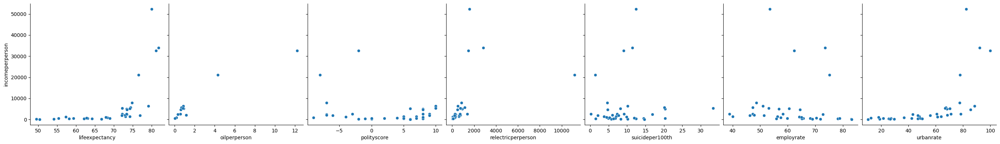

In [189]:
sns.pairplot(pib_df.sample(frac=0.2), height=4, y_vars="incomeperperson", x_vars=features[7:], kind="scatter")

Gráficamente, pareciera existir relación una relación lineal entre la variable objetivo y las siguientes variables:
* co2emissions
* internetuserate (se ve la relación lineal más fuerte)
* relectricperperson

Ahora bien, de acuerdo con la tabla de correlaciones elaborada en la herramienta "YDataProfiling", las variables con las cuales el PIB tiene una correlación más alta (mayor a 0.5) son las siguientes:
| incomeperperson    |   Indice de correlación |
|--------------------|-------------------------|
| internetuserate    | 0.863                   |
| lifeexpectancy     | 0.848                   |
| oilperson          | 0.825                   |
| relectricperperson | 0.895                   |
| co2Emissions       | 0.603                   |
| urbanrate          | 0.782                   |

En los siguientes scatterplot se muestra el comportamiento conjunto de incomeperperson (PIB) con respecto a las demás variables encontradas para validar visualmente el índice de correlación

**Relación entre PIB y tasa de usuarios de internet**

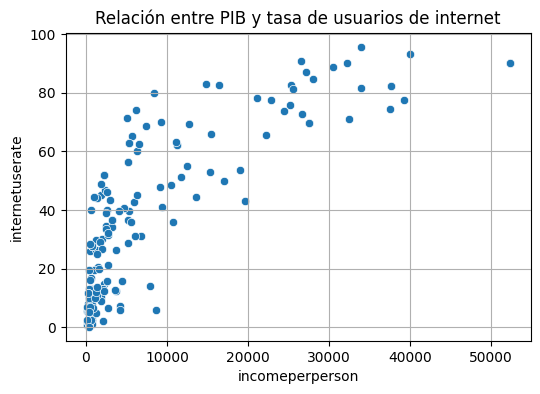

In [190]:
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=pib_df["incomeperperson"],
    y=pib_df["internetuserate"]
)
plt.title("Relación entre PIB y tasa de usuarios de internet")
plt.grid()
plt.show()

Se ve que sí existe correlación entre el PIB y la tasa de usuarios de internet. No pareciera haber una relación completamente lineal, sino más bien tangencial.

**Relación entre PIB y expectativa de vida**

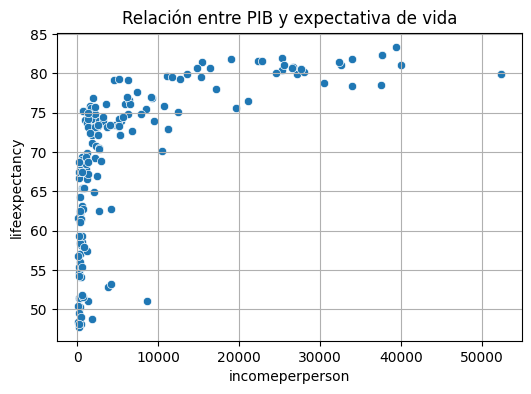

In [191]:
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=pib_df["incomeperperson"],
    y=pib_df["lifeexpectancy"]
)
plt.title("Relación entre PIB y expectativa de vida")
plt.grid()
plt.show()

Solamente se ve un cambio sustancial entre la expectativa de vida y el PIB cuando la expectativa de vida supera los 70 años, a partir de ahí se ve una correlación que podría interpretarse como lineal entre ambas variables.

**Relación entre PIB y consumo de petroleo per cápita**

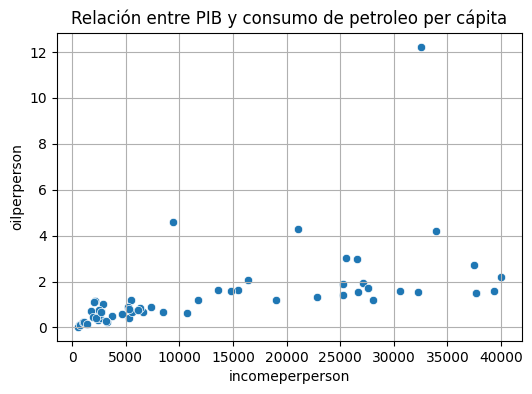

In [192]:
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=pib_df["incomeperperson"],
    y=pib_df["oilperperson"]
)
plt.title("Relación entre PIB y consumo de petroleo per cápita")
plt.grid()
plt.show()

Se ve una correlación lineal entre ambas variables con algunos outliers y una pendiente no tan pronunciada, es decir, solamente luego de un incremento relativamente grande en los ingresos por persona, se nota un incremento en el consumo de petroleo per cápita (toneladas por año y persona).

**Relación entre PIB y consumo de energía eléctrica por persona**

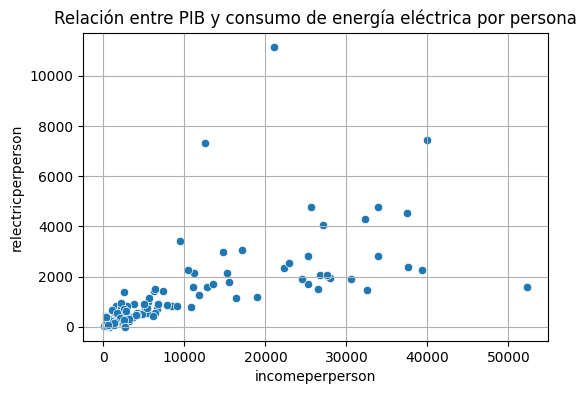

In [193]:
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=pib_df["incomeperperson"],
    y=pib_df["relectricperperson"]
)
plt.title("Relación entre PIB y consumo de energía eléctrica por persona")
plt.grid()
plt.show()

Se ve una correlación lineal antes de los 10,000 PIB y 2,000 KWh de consumo de energía eléctrica por persona, sin embargo, de ahí en adelante no se observa una correlación entre las variables

**Relación entre PIB y emisiones de CO2**

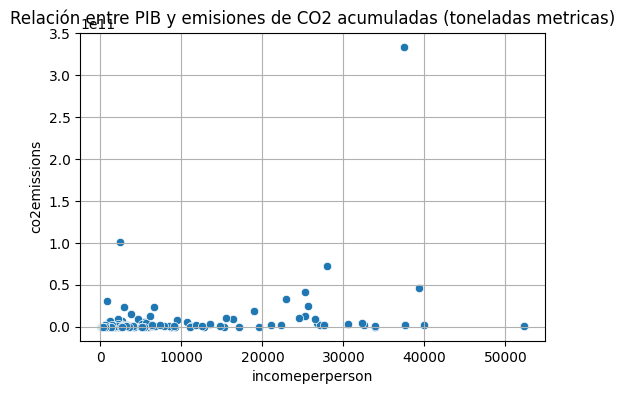

In [194]:
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=pib_df["incomeperperson"],
    y=pib_df["co2emissions"]
)
plt.title("Relación entre PIB y emisiones de CO2 acumuladas (toneladas metricas)")
plt.grid()
plt.show()

Visualmente, no se observa una cambio notable en la variable de emisiones de CO2 acumuladas con respecto a los cambios en el PIB, por ende, no se observa correlación entre las variables

**Relación entre PIB y tasa de ocupación urbana**

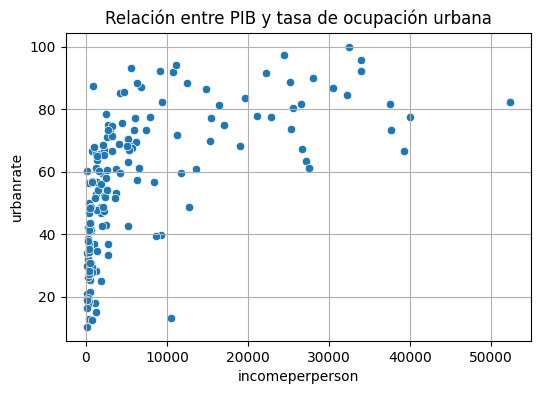

In [195]:
plt.figure(figsize=(6, 4))
sns.scatterplot(
    x=pib_df["incomeperperson"],
    y=pib_df["urbanrate"]
)
plt.title("Relación entre PIB y tasa de ocupación urbana")
plt.grid()
plt.show()

Se observa una relación que podría considerarse lineal con una pendiente muy grande entre los ingresos por persona y la tasa de ocupación urbana antes de los 10,000 en PIB y 80% de ocupación urbana. De ahí en adelante, no se observa correlación. Sin embargo, se tomará esta variable dado su índice de correlación superior a 0.7

**Conclusión análisis bivariado gráfico y numérico con variable objetivo**

El análisis gráfico y numérico de las variables con un mayor indice de correlación con la variable objetivo, que es el PIB (incomeperperson), muestra que las variables que muestran una correlación significativa tanto en su índice como gráficamente son las siguientes:
* Tasa de usuarios de internet (internetuserrate - 0.863): Correlación lineal
* Expectativa de vida (lifeexpectancy - 0.848): Correlación tangencial
* Consumo de petroleo per cápita (oilperperson - 0.825): Correlación lineal
* Consumo de energía eléctrica por persona (relectricperperson - 0.895): Correlación lineal hasta antes de los 10,000 PIB

En cuanto a las variables "emisiones de CO2 acumuladas" y "tasa de ocupación urbana", a pesar de que el índice de correlación con la variable objetivo era de más de 0.5, visualmente no se observó una correlación.

Ahora bien, se hace necesario analizar estas variables para detectar si hay una alta correlación entre ellas, y así poder descartar varias de ellas.

##### Índices de correlación entre variables con correlación significativa con la variable objetivo

En la siguiente tabla se muestran los índices de correlación entre las variables con correlación significativa con la variable objetivo

|                    | internetuserate | lifeexpectancy | oilperperson | relectricperperson |
|--------------------|-----------------|----------------|--------------|--------------------|
| internetuserate    | 1               | 0.854          | 0.689        | 0.857              |
| lifeexpectancy     | 0.854           | 1              | 0.724        | 0.791              |
| oilperperson       | 0.689           | 0.724          | 1            | 0.862              |
| relectricperperson | 0.857           | 0.791          | 0.862        | 1                  |

Se puede observar que, de estas variables, las más relacionadas entre sí son la tasa de usuarios de internet, el consumo de petroleo per cápita, y el consumo de energía eléctrica por persona, mientras que aquella cuyo indice de correlación con las demás es un poco inferior es la expectativa de vida.

De hecho, el consumo de energía eléctrica por persona tiene índices de correlación superiores a 0.85 con las variables de tasa de usuarios de internet y consumo de petroleo per cápita, esto ya que el uso de internet requiere que haya energía eléctrica, y en muchos paises la generación de energía eléctrica depende del uso de petroleo, lo cual explica esta alta correlación. En cambio, la correlación entre la tasa de usuarios de internet y el consumo de petroleo per cápita es un poco menos directa, sin embargo, tiene un índice de correlación de 0.689.

Por ende, se podría decir que la variable de **consumo de energía eléctrica** puede usarse para representar el comportamiento de las variables de consumo de petroleo per cápita y tasa de usuarios de internet.

Por otra parte, la **expectativa de vida** solamente tiene una correlación superior a 0.8 con la tasa de usuarios de internet, lo cual inicialmente pareciera ser un comportamiento inesperado pero se explica en la calidad de vida que conlleva el tener acceso a internet. Aún así, su correlación con las demás variables es de 0.72 con el consumo de petroleo per cápita y 0.79 con el consimo de energía eléctrica por persona, lo cual se explica por este mismo factor.

Por ende, de estas variables se puede tomar el consumo de energía eléctrica y la expectativa de vida, descartando las demás por su correlación superior a 0.8 con estas variables.

##### Índices de correlación entre otras variables

Las otras variables en las que se detectó un índice de correlación superior a 0.8 fueron la tasa de empleo y la tasa de empleo femenina, por lo cual podría utilizarse la tasa de empleo en el modelo que se construya para predecir el PIB.

### 4. Análisis de calidad

##### Relevancia

Al analizar el campo "País" en el análisis univariado se encontraron los siguientes registros duplicados, lo cual es una falla en la dimensión de "relevancia" de calidad de datos

In [196]:
duplicates_by_country.sort_values("country", ascending=True)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
148,Belarus,2737.67038,18.85000,3.71193,36.00000,999874333.30000,48.60000,0.30000,32.05214,70.34900,0.68783,-7.00000,614.90729,26.87469,53.40000,73.46000
27,Belarus,2737.67038,18.85000,3.71193,36.00000,999874333.30000,48.60000,0.30000,32.05214,70.34900,0.68783,-7.00000,614.90729,26.87469,53.40000,73.46000
124,Iran,2161.54651,1.03000,2.02640,17.10000,9183548000.00000,26.90000,0.20000,13.00011,72.97400,1.16258,-7.00000,753.20980,6.02188,47.80000,68.46000
116,Iran,2161.54651,1.03000,2.02640,17.10000,9183548000.00000,26.90000,0.20000,13.00011,72.97400,1.16258,-7.00000,753.20980,6.02188,47.80000,68.46000
0,Ireland,27595.09135,14.92000,0.45002,74.90000,1633778667.00000,51.00000,0.20000,69.77039,80.55700,1.70026,10.00000,2051.80234,10.36507,59.90000,61.34000
155,Ireland,27595.09135,14.92000,0.45002,74.90000,1633778667.00000,51.00000,0.20000,69.77039,80.55700,1.70026,10.00000,2051.80234,10.36507,59.90000,61.34000
143,Lithuania,5332.23859,16.30000,1.48783,38.50000,226255333.30000,48.80000,0.10000,62.81190,72.23100,0.81237,10.00000,758.85872,33.34186,53.10000,66.96000
25,Lithuania,5332.23859,16.30000,1.48783,38.50000,226255333.30000,48.80000,0.10000,62.81190,72.23100,0.81237,10.00000,758.85872,33.34186,53.10000,66.96000
97,Luxembourg,52301.58718,12.84000,0.73134,82.50000,592012666.70000,45.90000,0.30000,90.07953,79.96300,NaN,NaN,1566.10614,12.40592,53.50000,82.44000
166,Luxembourg,52301.58718,12.84000,0.73134,82.50000,592012666.70000,45.90000,0.30000,90.07953,79.96300,NaN,NaN,1566.10614,12.40592,53.50000,82.44000


Se ve que los registros duplicados son idénticos en todas sus dimensiones, por ende, se procede con su eliminación, lo cual debería eliminar 12 registros del dataset, quedando 166 registros ya que el dataset inicial tiene 178.

In [197]:
duplicates_by_country.shape

(24, 16)

In [198]:
pib_df = pib_df.drop_duplicates(subset=['country'])
pib_df.shape

(166, 16)

Una vez eliminados los duplicados, se ve que queda un total de 166 registros.

##### Completitud

Se revisa el conteo de registros faltantes por cada columna

In [199]:
pib_df.isna().sum()

country                   0
incomeperperson           3
alcconsumption            0
armedforcesrate           4
breastcancerper100th      1
co2emissions              2
femaleemployrate          1
hivrate                  22
internetuserate           3
lifeexpectancy            0
oilperperson            105
polityscore              10
relectricperperson       36
suicideper100th           0
employrate                1
urbanrate                 0
dtype: int64

Se ve que las columnas con un mayor número de datos faltantes son:
* hivrate (Tasa de VIH) - 13% del total de datos
* oilperperson (Consumo de petroleo per cápita) - 63.25% del total de datos
* polityscore (Puntaje de nivel de democracia) - 6.02% del total de datos
* relectricperperson (Consumo de energía eléctrica por persona) - 21.69% del total de datos

Teniendo en cuenta que, de acuerdo con lo visto en clase, solamente se deberían llenar datos en columnas con menos del 7% de datos faltantes, no se pueden llenar los datos faltantes de las columnas "Consumo de petroleo per cápita" ni "Consumo de energía eléctrica por persona" ni "tasa de VIH". Al ser tantos datos faltantes, se decide descartar estas columnas del análisis para la construcción del modelo.

Dado que en el análisis bivariado se determinó que la variable "tasa de internet" está altamente relacionada con "Consumo de petroleo per cápita" y "Consumo de energía eléctrica por persona", se utilizará "tasa de internet" en vez de estas variables para alimentar el modelo de predicción del PIB.

In [200]:
pib_df = pib_df.drop(['hivrate','oilperperson','relectricperperson'],axis=1)
pib_df.shape

(166, 13)

Todas las demás variables, al tener un máximo de 10 registros faltantes (menos del 6.1% del total de registros), se llenarán con la mediana ya que su distribución no es normal, excepto la tasa de empleo y la tasa de empleo femenina, variables con una distribución parecida a la normal y que solo tienen un registro faltante. El comportamiento de las variables se visualizó usando el Dashboard generado usando YDataProfiling.

Por ejemplo, a continuación se muestra la distribución del PIB (incomeperperson) y tasa de empleo (employrate), demostrando que el PIB no tiene distribución normal mientras que la tasa de empleo tiene una distribución parecida a la normal.

[]

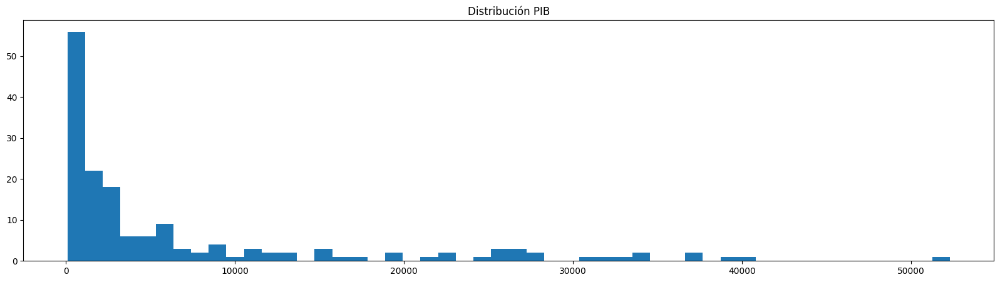

In [201]:
plt.figure(figsize=(20, 5))
plt.hist(pib_df["incomeperperson"],bins=50)
plt.title("Distribución PIB")
plt.plot()

[]

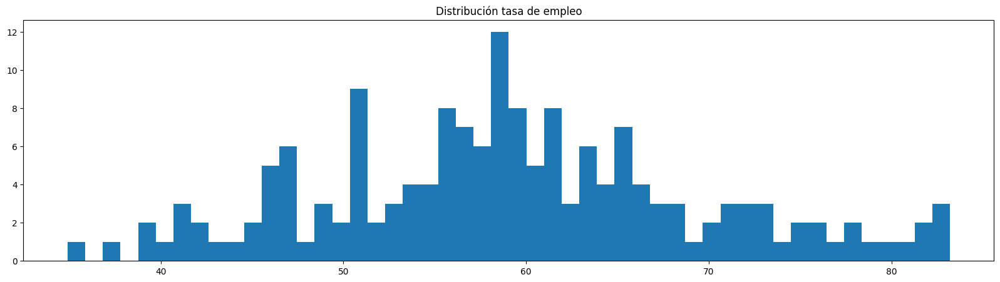

In [202]:
plt.figure(figsize=(20, 5))
plt.hist(pib_df["employrate"],bins=50)
plt.title("Distribución tasa de empleo")
plt.plot()

A continuación se llenan las columnas con la mediana o media, dependiendo de su distribución

In [203]:
pib_df['incomeperperson'].fillna(value=pib_df['incomeperperson'].median(), inplace=True)
pib_df['armedforcesrate'].fillna(value=pib_df['armedforcesrate'].median(), inplace=True)
pib_df['breastcancerper100th'].fillna(value=pib_df['breastcancerper100th'].median(), inplace=True)
pib_df['co2emissions'].fillna(value=pib_df['co2emissions'].median(), inplace=True)
pib_df['femaleemployrate'].fillna(value=pib_df['femaleemployrate'].mean(), inplace=True)
pib_df['internetuserate'].fillna(value=pib_df['internetuserate'].median(), inplace=True)
pib_df['polityscore'].fillna(value=pib_df['polityscore'].median(), inplace=True)
pib_df['employrate'].fillna(value=pib_df['employrate'].mean(), inplace=True)

Se revisa de nuevo el conteo de registros faltantes, verificando que ya no queda ninguno

In [204]:
pib_df.isna().sum()

country                 0
incomeperperson         0
alcconsumption          0
armedforcesrate         0
breastcancerper100th    0
co2emissions            0
femaleemployrate        0
internetuserate         0
lifeexpectancy          0
polityscore             0
suicideper100th         0
employrate              0
urbanrate               0
dtype: int64

##### Consistencia

A continuación se revisan las métricas estadísticas de todas las columnas para validar que todos los valores estén dentro del dominio de valores esperado dada la descripción de las columnas.

In [205]:
pib_df.describe()

,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,internetuserate,lifeexpectancy,polityscore,suicideper100th,employrate,urbanrate
count,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000,166.00000
mean,7114.23979,6.66380,1.34887,37.40361,5986751869.48371,47.94121,33.56322,69.10389,3.83133,9.82593,59.18909,55.93651
std,10393.96488,5.02647,1.49943,22.97334,28139888597.59739,14.73419,27.68587,9.97651,6.11470,6.30343,10.32594,22.84426
min,103.77586,0.03000,0.00000,3.90000,850666.66670,12.40000,0.21007,47.79400,-10.00000,0.20145,34.90000,10.40000
25%,609.43775,2.44500,0.48406,20.60000,79505249.99750,39.25000,9.28506,62.46750,-1.00000,5.66685,52.20000,36.84000
50%,2344.89692,5.92000,0.91707,29.80000,280377166.70000,48.20000,28.73188,72.97400,6.00000,8.94323,58.90000,57.61000
75%,8305.51203,9.74250,1.54764,49.97500,2372442416.50000,56.15000,51.98009,76.12750,9.00000,12.40987,65.00000,73.47500
max,52301.58718,23.01000,9.82013,101.10000,334000000000.00000,83.30000,95.63811,83.39400,10.00000,35.75287,83.20000,100.00000


Se espera que, dada la naturaleza de todos los valores, todos sean positivos excepto en la columna "polityscore" que puede ir de -10 a 10. Tal como muestra la tabla, efectivamente todos los valores son positivos (el valor mínimo es mayor a 0), y en la columna "polityscore" el valor mínimo es -10 y el máximo 10, que es acorde a lo descrito en el diccionario de datos.

Además, se observa que en las columnas que son porcentajes, como "employrate" e "internetuserate" los valores máximos no superan 100, lo cual muestra que los porcentajes son consistentes, y columnas con dominios particulares como lifeexpectancy, que es la expectativa de vida en años, tiene valores mínimos y máximos que corresponden al dominio de valores esperado, que en este caso es la edad. Por lo tanto, se encuentra que el set de datos tiene datos consistentes.

##### Conformidad, Precisión, Procesabilidad, Disponibilidad, Temporalidad, Credibilidad 

En el análisis realizado se encuentra también que los datos cumplen con las demás dimensiones de calidad de datos, excepto la temporalidad, ya que son datos de 2010 o antes. En cuanto a la conformidad, son datos numéricos que se ciñen a las reglas establecidas en el diccionario de datos, la precisión es la requerida ya que están a nivel país, son procesables, están disponibles, y vienen de una fuente creíble.

In [206]:
pib_df["incomeperperson"].median()

2344.896916

#### 5. Complementación dataset

Para complementar el Dataset con información categórica de los paises como ubicación geográfica, nivel de desarrollo, entre otros, se toma un archivo del Dataset "[World Development Indicators](https://www.gapminder.org/data/)" del [repositorio Github](https://github.com/open-numbers/ddf--open_numbers--world_development_indicators) de Gapminder, particularmente el archivo "ddf--entities--geo--country.csv", que tiene información categórica de 273 paises.

In [207]:
countries_df = pd.read_csv("./data/ddf--entities--geo--country.csv")

In [208]:
countries_df.shape

(273, 23)

In [209]:
countries_df.sample(5)

,country,g77_and_oecd_countries,income_3groups,income_groups,is--country,iso3166_1_alpha2,iso3166_1_alpha3,iso3166_1_numeric,iso3166_2,landlocked,latitude,longitude,main_religion_2008,name,un_sdg_ldc,un_sdg_region,un_state,unhcr_region,unicef_region,unicode_region_subtag,west_and_rest,world_4region,world_6region
256,ussr,others,NaN,NaN,True,NaN,NaN,NaN,NaN,coastline,NaN,NaN,NaN,USSR,NaN,NaN,False,NaN,NaN,NaN,NaN,europe,europe_central_asia
116,irq,g77,middle_income,upper_middle_income,True,IQ,IRQ,368.00000,NaN,coastline,33.00000,44.00000,muslim,Iraq,un_not_least_developed,un_northern_africa_and_western_asia,True,unhcr_middle_east_north_africa,mena,IQ,rest,asia,middle_east_north_africa
250,tza,g77,low_income,low_income,True,TZ,TZA,834.00000,NaN,coastline,-6.00000,35.00000,christian,Tanzania,un_least_developed,un_sub_saharan_africa,True,unhcr_east_horn_africa_great_lates,ssa,TZ,rest,africa,sub_saharan_africa
106,hnd,g77,middle_income,lower_middle_income,True,HN,HND,340.00000,NaN,coastline,15.00000,-86.50000,christian,Honduras,un_not_least_developed,un_latin_america_and_the_caribbean,True,unhcr_americas,lac,HN,rest,americas,america
257,uzb,others,middle_income,lower_middle_income,True,UZ,UZB,860.00000,NaN,landlocked,41.66667,63.83333,muslim,Uzbekistan,un_not_least_developed,un_central_and_southern_asia,True,unhcr_asia_pacific,eca,UZ,rest,asia,europe_central_asia


En general, el dataset tiene información sobre la ubicación geográfica de los paises tanto en coordenadas como en región, su código correspondiente a diferentes estandarizaciones, si es costero o no, religión y nivel de desarrollo. Luego de analizar el Dataset, se seleccionan las siguientes tres variables que se considera representan de forma amplia la información contenida en el dataset:
1. incomegroups: Hace referencia al nivel de ganancias de los paises. Los posibles valores son: high_income,low_income,lower_middle_income,upper_middle_income
2. landlocked: Hace referencia a si el pais es costero o no. Los posibles valores son coastline y landlocked.
3. unicef_region: Ubicación geográfica del país de acuerdo a las regiones establecidas por la UNICEF. Los posibles valores son:
    * eap: East Asia and Pacific
    * eca: Europe and Central Asia
    * lac: Latin America and Caribbean
    * mena: Middle East and North Africa
    * na: North America
    * sa: South Asia
    * ssa: Sub-Saharan Africa

A continuación se unen los dataframes, tomando de `countries_df` solamente las columnas de interés. Se utiliza la estrategia "left" para no afectar el dataset original en caso de que no se encuentre algún país por nombre.

In [210]:
countries_df_cols = countries_df[["name","income_groups","landlocked","unicef_region"]]
pib_df_merged = pib_df.merge(countries_df_cols,left_on='country', right_on='name',how='left')
pib_df_merged.shape


(166, 17)

Se muestran los paises que no se encontraron en el dataset de paises

In [211]:
pib_df_merged.loc[pib_df_merged["income_groups"].isna()]

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,internetuserate,lifeexpectancy,polityscore,suicideper100th,employrate,urbanrate,name,income_groups,landlocked,unicef_region
2,Central African Rep.,239.51875,3.17000,0.14866,16.50000,8338000.00000,62.90000,2.30003,48.39800,-1.00000,13.54842,71.30000,38.58000,NaN,NaN,NaN,NaN
18,"Macedonia, FYR",2221.18566,8.94000,2.10147,52.10000,168883000.00000,26.80000,51.91418,74.84700,9.00000,7.87688,34.90000,66.90000,NaN,NaN,NaN,NaN
23,"Korea, Rep.",16372.49978,19.15000,2.83397,20.40000,9666891667.00000,48.00000,82.51593,80.64200,8.00000,22.40456,58.90000,81.46000,NaN,NaN,NaN,NaN
44,"Yemen, Rep.",610.35737,0.20000,2.31623,35.10000,234864666.70000,20.30000,12.34975,65.49300,-2.00000,6.26579,39.00000,30.64000,NaN,NaN,NaN,NaN
54,Swaziland,1810.23053,5.05000,0.91707,12.30000,22704000.00000,47.10000,9.00774,48.71800,-9.00000,12.87222,50.90000,24.94000,NaN,NaN,NaN,NaN
70,Kyrgyzstan,372.72841,4.72000,0.83777,23.00000,87970666.67000,48.80000,19.58232,67.71400,1.00000,9.87528,58.90000,36.28000,NaN,NaN,NaN,NaN
109,Dominican Rep.,4049.16963,6.28000,1.46937,36.10000,446365333.30000,40.50000,39.53127,73.39600,8.00000,6.51954,52.70000,69.02000,NaN,NaN,NaN,NaN
135,United Kingdom,28033.48928,13.24000,0.50802,87.20000,72524250333.00000,53.10000,84.73170,80.17000,10.00000,6.01466,59.30000,89.94000,NaN,NaN,NaN,NaN
146,Czech Rep.,7381.31275,16.47000,0.51571,58.40000,1776016000.00000,47.60000,68.63813,77.68500,8.00000,12.36798,56.00000,73.50000,NaN,NaN,NaN,NaN
148,United Arab Emirates,21087.39412,0.52000,1.81248,24.10000,2315698000.00000,37.30000,77.99678,76.54600,-8.00000,1.39295,75.20000,77.88000,NaN,NaN,NaN,NaN


Luego de realizar una búsqueda manual, se ve los 12 paises que no fueron encontrados en el dataset de paises no aparecen ya que su nombre es diferente. A continuación se muestra el nombre del país en el dataset original y el nombre que dicho país tiene en el dataset de paises. Se entiende que "Swaziland" corresponde a un error de tipografía y que su nombre correcto es "Switzerland".

|Nombre en el dataset original| Nombre en el dataset de paises | 
|--------------------|--|
|Central African Rep.|Central African Republic|
|Macedonia, FYR|North Macedonia|
|Korea, Rep.|North Korea|
|Yemen, Rep.|Yemen|
|Swaziland|Switzerland|
|Kyrgyzstan|Kyrgyz Republic|
|Dominican Rep.|Dominican Republic|
|United Kingdom|UK|
|Czech Rep.|Czech Republic|
|United Arab Emirates|UAE|
|Laos|Lao|
|United States|USA|

Se crea un diccionario para reemplazar los valores

In [212]:
countries_dict = {"Central African Rep.":"Central African Republic",
"Macedonia, FYR":"North Macedonia",
"Korea, Rep.":"North Korea",
"Yemen, Rep.":"Yemen",
"Swaziland":"Switzerland",
"Kyrgyzstan":"Kyrgyz Republic",
"Dominican Rep.":"Dominican Republic",
"United Kingdom":"UK",
"Czech Rep.":"Czech Republic",
"United Arab Emirates":"UAE",
"Laos":"Lao",
"United States":"USA"}

Se reemplazan los valores en el dataset original, validando que el nombre del pais no exista

In [213]:
for nombre_original,nombre_nuevo in countries_dict.items():
    # Valida que no haya ningún registro con el nuevo nombre
    if pib_df.loc[pib_df["country"] == nombre_nuevo].size == 0:
        pib_df["country"] = pib_df["country"].replace(to_replace=nombre_original,value=nombre_nuevo)
    else:
        print("{} ya existe!".format(nombre_nuevo))

Switzerland ya existe!


Ya que Switzerland ya existe, se traen los registros correspondientes a "Swaziland" y "Switzerland" para compararlos

In [214]:
pib_df.loc[(pib_df["country"] == "Switzerland") | (pib_df["country"] == "Swaziland")]

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,internetuserate,lifeexpectancy,polityscore,suicideper100th,employrate,urbanrate
5,Switzerland,37662.75125,11.41000,0.52422,81.70000,2406741333.00000,57.00000,82.16666,82.33800,10.00000,13.23981,64.30000,73.48000
56,Swaziland,1810.23053,5.05000,0.91707,12.30000,22704000.00000,47.10000,9.00774,48.71800,-9.00000,12.87222,50.90000,24.94000


Se ve que Swaziland no corresponde a los datos de Switzerland, por lo cual se descarta un error de tipografía. Se busca en Google este pais, y se encuentra que su nombre actual es "Eswatini", por lo cual se procede con su actualización.

In [215]:
pib_df["country"] = pib_df["country"].replace(to_replace="Swaziland",value="Eswatini")

Se hace el merge nuevamente

In [216]:
pib_df_merged = pib_df.merge(countries_df_cols,left_on='country', right_on='name',how='left')
pib_df_merged.shape

(166, 17)

Se valida que se encontraron todos los paises

In [217]:
pib_df_merged.loc[pib_df_merged["income_groups"].isna()]

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,internetuserate,lifeexpectancy,polityscore,suicideper100th,employrate,urbanrate,name,income_groups,landlocked,unicef_region


In [218]:
pib_df_merged.sample(5)

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,internetuserate,lifeexpectancy,polityscore,suicideper100th,employrate,urbanrate,name,income_groups,landlocked,unicef_region
131,Sweden,32292.48298,9.50000,0.35209,87.80000,4286590000.00000,56.70000,90.01619,81.43900,10.00000,11.11583,60.70000,84.54000,Sweden,high_income,coastline,eca
52,Syria,1525.78012,1.49000,5.95585,44.80000,1436893333.00000,16.70000,20.66316,75.85000,-7.00000,0.52353,44.80000,54.22000,Syria,low_income,coastline,mena
119,Honduras,1392.41183,4.43000,0.71082,25.90000,131703000.00000,34.20000,11.09076,73.12600,7.00000,7.06018,56.30000,47.88000,Honduras,lower_middle_income,coastline,lac
79,Papua New Guinea,744.23941,3.64000,0.10511,17.30000,88337333.33000,68.90000,1.28005,62.79100,4.00000,11.95694,70.40000,12.54000,Papua New Guinea,lower_middle_income,coastline,eap
7,Oman,11191.81101,0.92000,4.46600,13.20000,487993000.00000,22.60000,61.98741,72.97400,-8.00000,3.71674,50.70000,71.62000,Oman,high_income,coastline,mena


Finalmente, se descarta la columna "name" ya que es la misma que "country"

In [219]:
pib_df_merged = pib_df_merged.drop(['name'],axis=1)
pib_df_merged.shape

(166, 16)

##### Análisis calidad de datos variables categóricas

A continuación se verifica que no hayan valores vacíos en las variables categóricas y que todos los valores correspondan al dominio de valores esperado

In [220]:
null_count = pib_df_merged["income_groups"].isnull().sum()
print("Número de nulos income groups:", null_count)

null_count = pib_df_merged["landlocked"].isnull().sum()
print("Número de nulos landlocked:", null_count)

null_count = pib_df_merged["unicef_region"].isnull().sum()
print("Número de nulos unicef_region:", null_count)

Número de nulos income groups: 0
Número de nulos landlocked: 0
Número de nulos unicef_region: 0


In [221]:
pib_df_merged["income_groups"].unique()

array(['high_income', 'upper_middle_income', 'low_income',
       'lower_middle_income'], dtype=object)

In [222]:
pib_df_merged["landlocked"].unique()

array(['coastline', 'landlocked'], dtype=object)

In [223]:
pib_df_merged["unicef_region"].unique()

array(['eca', 'ssa', 'lac', 'mena', 'eap', 'sa', 'na'], dtype=object)

#### 4. Particionamiento del conjunto de datos en entrenamiento y prueba


De todo el análisis realizado previamente, se encontró que por la alta correlación y linealidad con la variable objetivo y por tener datos suficientes, se pueden utilizar las siguientes variables en el modelo:
* internetuserate
* lifeexpectancy
* employrate
* urbanrate

Y de las variables categóricas agregadas posteriormente, se utilizarán las tres, es decir:
* income_groups
* landlocked
* unicef_region

In [224]:
features = ["internetuserate","lifeexpectancy","employrate","urbanrate","income_groups","landlocked","unicef_region"]
categorical_features = ["income_groups","landlocked","unicef_region"]
numerical_features = ["internetuserate","lifeexpectancy","employrate","urbanrate"]
objective = ["incomeperperson"]

En este análisis se crearán dos modelos: uno en el que se tomen tanto las variables categóricas como las numéricas, y otro en el que solo se tomen las numéricas, esto con el fin de validar si el rendimiento del modelo mejora con la inclusión de variables categóricas.

In [225]:
X_train, X_test, y_train, y_test = train_test_split(pib_df_merged[features], pib_df_merged[objective[0]], test_size=0.3, random_state=2)
X_train_num, X_test_num, y_train_num, y_test_num = train_test_split(pib_df_merged[numerical_features], pib_df_merged[objective[0]], test_size=0.3, random_state=2)

In [226]:
print(X_train.shape, y_train.shape)
print(X_train_num.shape, y_train_num.shape)

(116, 7) (116,)
(116, 4) (116,)


In [227]:
print(X_test.shape, y_test.shape)
print(X_test_num.shape, y_test_num.shape)

(50, 7) (50,)
(50, 4) (50,)


#### 5. Entrenamiento de los modelos

Se define un column transformer para hacer one hot encoding a las variables categóricas

In [228]:
ct = ColumnTransformer([('encode_cats', OneHotEncoder(), categorical_features)],
                       remainder='passthrough')

Se revisa como quedan los datos de entrenamiento luego de que se les aplique el one hot encoding. Las columnas que no son categóricas no se modifican.

In [229]:
pd.DataFrame(ct.fit_transform(X_train), columns = ct.get_feature_names_out())

,encode_cats__income_groups_high_income,encode_cats__income_groups_low_income,encode_cats__income_groups_lower_middle_income,encode_cats__income_groups_upper_middle_income,encode_cats__landlocked_coastline,encode_cats__landlocked_landlocked,encode_cats__unicef_region_eap,encode_cats__unicef_region_eca,encode_cats__unicef_region_lac,encode_cats__unicef_region_mena,encode_cats__unicef_region_na,encode_cats__unicef_region_sa,encode_cats__unicef_region_ssa,remainder__internetuserate,remainder__lifeexpectancy,remainder__employrate,remainder__urbanrate
0,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,65.16325,74.41400,47.30000,67.50000
1,0.00000,0.00000,0.00000,1.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,6.00344,51.08800,61.70000,39.38000
2,0.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,5.99984,53.18300,46.00000,59.58000
3,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,3.86057,48.19600,56.30000,25.46000
4,0.00000,0.00000,1.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,19.44502,68.28700,57.50000,36.82000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111,1.00000,0.00000,0.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,79.88978,75.44600,53.40000,56.56000
112,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,9.99995,51.09300,75.70000,56.70000
113,0.00000,0.00000,0.00000,1.00000,0.00000,1.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,46.67970,70.73900,60.90000,51.92000
114,0.00000,1.00000,0.00000,0.00000,0.00000,1.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,1.00000,13.00001,55.44200,79.80000,18.34000


Se define un pipeline en el que se hace un z-score para que las magnitudes de las variables puedan ser directamente comparadas. En este Pipeline se agrega el `ColumnTransformer`, y finalmente se aplica la regresión lineal. Luego se define un segundo pipeline en el que solo se toman las variables numéricas, por ende, no es necesario agregarle el `ColumnTransformer`

In [230]:
pipeline = Pipeline(
    [
        ("onehot",ct),
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

pipeline_num = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

Se entrena el modelo con las variables categóricas

In [231]:
pipeline.fit(X_train, y_train)

Pipeline(steps=[('onehot',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('encode_cats',
                                                  OneHotEncoder(),
                                                  ['income_groups',
                                                   'landlocked',
                                                   'unicef_region'])])),
                ('scaler', StandardScaler()), ('model', LinearRegression())])

Se entrena el modelo sin las variables categóricas

In [232]:
pipeline_num.fit(X_train_num, y_train_num)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

A continuación se muestran los coeficientes de influencia sobre el modelo de cada variable para el modelo con las variables categóricas

In [233]:
pd.DataFrame({"columns": ct.get_feature_names_out(), "coef": pipeline["model"].coef_}).sort_values(by="coef",ascending=False)

,columns,coef
13,remainder__internetuserate,3788.69394
0,encode_cats__income_groups_high_income,2820.90001
16,remainder__urbanrate,1305.08250
14,remainder__lifeexpectancy,1233.06565
10,encode_cats__unicef_region_na,1145.49845
12,encode_cats__unicef_region_ssa,1115.34115
15,remainder__employrate,719.57585
11,encode_cats__unicef_region_sa,598.97331
6,encode_cats__unicef_region_eap,459.82389
4,encode_cats__landlocked_coastline,122.49037


Dado que gracias a la normalización los coeficientes de las variables son directamente comparables, se ve que la variable de entrada que tiene mayor impacto sobre la variable objetivo (el PIB) es `internetuserate`, seguida de `income_groups_high_income`, lo cual es esperado ya que los paises considerados como de altos ingresos se espera que tengan un PIB alto. Así mismo, se ve una influencia alta pero negativa de la variable `income_groups_lower_middle_income`, lo cual es esperado ya que los paises considerados como de bajos o medianos ingresos se espera que tengan un PIB bajo. Finalmente, las variables `urbanrate` y `lifeexpectancy` son las siguientes con mayor influencia sobre la variable objetivo en términos absolutos. Se ve que la mayoría de categorías de las variables categóricas no influyen en gran medida sobre el PIB.

Coeficientes de influencia para el modelo sin variables categóricas

In [234]:
pd.DataFrame({"columns": numerical_features, "coef": pipeline_num["model"].coef_}).sort_values(by="coef",ascending=False)

,columns,coef
0,internetuserate,7359.11044
2,employrate,1929.57560
3,urbanrate,1433.05631
1,lifeexpectancy,-166.17509


Tal como se observó también en el modelo de clasificación, la variable de entrada que tiene mayor impacto por un gran margen sobre la variable objetivo (el PIB) es `internetuserate`, solo que esta vez es seguida de `employrate`. También se ve que `urbanrate` tiene más influencia sobre la variable objetivo que `lifeexpectancy`, sin embargo, la influencia de `lifeexpectancy` sobre la variable objetivo es pequeña con respecto a la influencia de las demás (menos del 10%) y es negativa. En este modelo prácticamente el 70% de influencia sobre el PIB recae en `internetuserate`.

In [235]:
pipeline["model"].intercept_

6570.583047118966

In [236]:
pipeline_num["model"].intercept_

6570.583047118966

In [237]:
y_train.mean(), y_test.mean()

(6570.5830471189665, 8375.523433152)

Se ve que el intercepto en ambos modelos corresponde a la media de PIB de los datos de entrenamiento.

#### 6. Análisis del error

##### Modelo con variables categóricas

Para tener un contexto sobre las métricas de error que se calcularán a continuación, se analizan las métricas del PIB que se tiene en el conjunto de test

In [238]:
y_test.describe(percentiles=[0.25, 0.5, 0.75, 0.99])

count      50.00000
mean     8375.52343
std     12410.96738
min       155.03323
25%       738.26089
50%      2068.54921
75%      8904.05730
99%     46260.26232
max     52301.58718
Name: incomeperperson, dtype: float64

In [239]:
print("MAE:")
print("Train:", mean_absolute_error(y_train, pipeline.predict(X_train)))
print("Test:", mean_absolute_error(y_test, pipeline.predict(X_test)))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train, pipeline.predict(X_train))))
print("Test:", np.sqrt(mean_squared_error(y_test, pipeline.predict(X_test))))

MAE:
Train: 3022.027184692571
Test: 5215.63926379725

RMSE:
Train: 4179.45402545049
Test: 7682.71963407488


Se ve que hay una gran diferencia entre los errores de entrenamiento y test, lo cual lleva a concluir que el modelo está sobreajustado.

Ahora bien, a pesar de que estos errores son máximo ligeramente superiores a la mitad de una desviación estándar de los datos de test, es decir, son mucho menores a una desviación estándar, hay que tener en cuenta que en el set de datos se encuentran muchos paises cuyo PIB es tan alto que se puede considerar outlier, haciendo más grande la desviación estándar. Normalmente una desviación estandar es menor a la media, sin embargo, en esta distribución la desviación estándar es 50% mayor a la media, y dado que incluso el error de test de RMSE es cercano a la media, se puede concluir que los valores de error son demasiado grandes, por lo cual no se podría desplegar este modelo en producción.

**Distribución de los errores**

In [240]:
abs(y_test-pipeline.predict(X_test)).describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

count      50.00000
mean     5215.63926
std      5698.30695
min       113.36460
25%      1852.20371
50%      3194.11457
75%      7399.02296
95%     15051.97691
99%     23804.76299
max     30673.20414
Name: incomeperperson, dtype: float64

El 75% de los errores se encuentran ligeramente por debajo de la media, lo cual lleva a concluir que estos valores de error son demasiado grandes como para desplegar el modelo en producción.

##### Modelo con variables netamente numéricas

Para tener un contexto sobre las métricas de error que se calcularán a continuación, se analizan las métricas del PIB que se tiene en el conjunto de test

In [241]:
y_test_num.describe(percentiles=[0.25, 0.5, 0.75, 0.99])

count      50.00000
mean     8375.52343
std     12410.96738
min       155.03323
25%       738.26089
50%      2068.54921
75%      8904.05730
99%     46260.26232
max     52301.58718
Name: incomeperperson, dtype: float64

In [242]:
print("MAE:")
print("Train:", mean_absolute_error(y_train_num, pipeline_num.predict(X_train_num)))
print("Test:", mean_absolute_error(y_test_num, pipeline_num.predict(X_test_num)))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train_num, pipeline_num.predict(X_train_num))))
print("Test:", np.sqrt(mean_squared_error(y_test_num, pipeline_num.predict(X_test_num))))

MAE:
Train: 4013.166542977892
Test: 5245.934093414385

RMSE:
Train: 5186.169325900285
Test: 7237.734161313532


Distribución de los errores

In [243]:
abs(y_test_num-pipeline_num.predict(X_test_num)).describe(percentiles=[0.25, 0.5, 0.75, 0.95, 0.99])

count      50.00000
mean     5245.93409
std      5037.10429
min       129.50446
25%      1546.55898
50%      4188.76058
75%      6516.97531
95%     13486.04566
99%     22320.56901
max     29093.63146
Name: incomeperperson, dtype: float64

Se ve una ligera mejora en las métricas de error usando este modelo con variables netamente numéricas, sin embargo, siguen siendo demasiado altas como para implementar el modelo en producción. Aún así, se ve que el agregar variables categóricas no mejoró el desempeño del modelo. Esto podría ser causa de una selección errada de variables, sin embargo, los coeficientes de influencia de las variables categóricas se veia que no eran muy altos con respecto a los coeficientes de las variables numéricas.

#### 7. Validación normalidad de los errores - Modelo con variables numéricas

A lo largo del laboratorio se validaron los supuestos de la colinealidad y linealidad de la regresión lineal. A continuación se intentará lograr que los errores tengan una distribución normal y mejorar así el desempeño del modelo. Se toma el modelo numérico ya que es el que tiene mejor desempeño.

In [244]:
errors = (pipeline_num.predict(X_train_num)-y_train_num).values

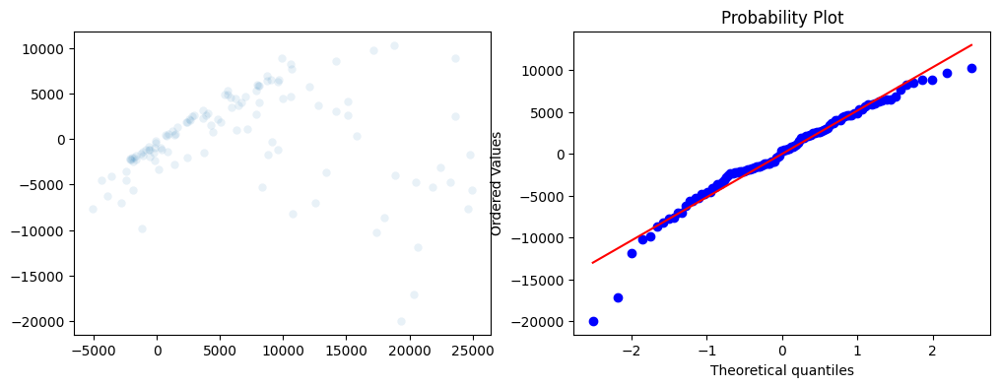

In [245]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=pipeline_num.predict(X_train_num), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

Dado que se ve que algunos registros se desvian demasiado de la distribución normal, lo cual puede también estar afectando las métricas del modelo, se eliminan los registros cuyo valor de variable objetivo pueda considerarse un valor atípico, usando como umbral el rango intercuartilico.

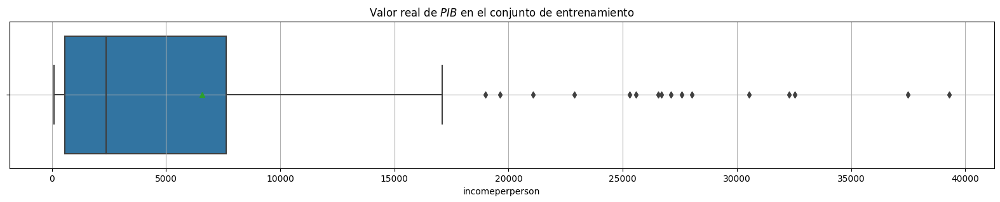

In [246]:
plt.figure(figsize=(20, 3))
sns.boxplot(x=y_train_num, showmeans=True, orient="h")
plt.title("Valor real de $\t{PIB}$ en el conjunto de entrenamiento")
plt.grid()
plt.show()

In [247]:
q1 = y_train_num.quantile(0.25)
q3 = y_train_num.quantile(0.75)
# Rango intercuartilico
iqr = q3-q1
threshold = q3+1.5*iqr
print("Rango intercuartilico:",threshold)

Rango intercuartilico: 18277.219852125003


Se acotan los dataframes de entrenamiento y prueba usando el rango intercuarilico calculado sobre los datos de entrenamiento

In [248]:
y_train_num = y_train_num.loc[y_train_num <= threshold]
X_train_num = X_train_num.loc[y_train_num.index]

In [249]:
y_test_num = y_test_num.loc[y_test_num <= threshold]
X_test_num = X_test_num.loc[y_test_num.index]

Se re entrena el modelo

In [250]:
pipeline_num_iqr = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("model", LinearRegression())
    ]
)

In [251]:
pipeline_num_iqr.fit(X_train_num, y_train_num)

Pipeline(steps=[('scaler', StandardScaler()), ('model', LinearRegression())])

In [252]:
pd.DataFrame({"columns": numerical_features, "coef": pipeline_num_iqr["model"].coef_}).sort_values(by="coef",ascending=False)

,columns,coef
0,internetuserate,2025.47695
3,urbanrate,1149.92648
2,employrate,538.39459
1,lifeexpectancy,252.43316


Se ve que la influencia que tienen las variables sobre la variable objetivo se balanceó con respecto al modelo que no descartaba los outliers. Antes, `internetuserrate` tenía prácticamente el 70% de influencia, y su coeficiente triplicaba el valor del segundo coeficiente, ahora tiene un 50% de influencia y su coeficiente pasó a ser ligeramente inferior al doble del segundo coeficiente. Por otra parte, `urbanrate` pasó a ser la segunda variable con más influencia, `employrate` pasó a ser la tercera, y `lifeexpectancy` pasó a ser la última y su influencia sobre la variable objetivo pasó a ser directamente proporcional.

##### Análisis del error

Se muestran las métricas del set de training acotado usando el rango intercuartilico

In [253]:
y_test_num.describe(percentiles=[0.25, 0.5, 0.75, 0.99])

count      42.00000
mean     3546.20352
std      4241.66576
min       155.03323
25%       609.43775
50%      1715.70381
75%      5295.35628
99%     15938.45720
max     16372.49978
Name: incomeperperson, dtype: float64

Se ve una disminución drástica en la desviación estándar con respecto al modelo numérico que toma en cuenta los outliers, que pasó de ser de alrededor de 12,000 a 4,241, y esta desviación estándar se acerca un poco más a la media, cuyo valor también disminuyó como era de esperarse ya que los outliers están principalmente a la derecha (valores de PIB muy grandes).

In [254]:
print("MAE:")
print("Train:", mean_absolute_error(y_train_num, pipeline_num_iqr.predict(X_train_num)))
print("Test:", mean_absolute_error(y_test_num, pipeline_num_iqr.predict(X_test_num)))
print("\nRMSE:")
print("Train:", np.sqrt(mean_squared_error(y_train_num, pipeline_num_iqr.predict(X_train_num))))
print("Test:", np.sqrt(mean_squared_error(y_test_num, pipeline_num_iqr.predict(X_test_num))))

MAE:
Train: 1837.2286885912024
Test: 1957.74162051091

RMSE:
Train: 2580.693302687954
Test: 2683.655863124719


Se ve una mejora muy grande en las métricas de error:
1. Por una parte, los errores de training y test son mucho más cercanos, con una diferencia de menos del 6%, cuando con el modelo que tenía en cuenta los outliers se tenían diferencias de alrededor del 25%, lo cual permite descartar un sobreajuste.
2. Por otra parte, los valores de error se redujeron en más de la mitad, pasando de ser del orden de los 4,000 o hasta 7,000 al orden de los 2,000, lo cual denota una gran mejora. Estos valores de error son mucho menores que una desviación estándar y que la media, por ende, se podría decir que este modelo proporciona una buena estimación del PIB de los paises.

In [255]:
errors = (pipeline_num.predict(X_train_num)-y_train_num).values

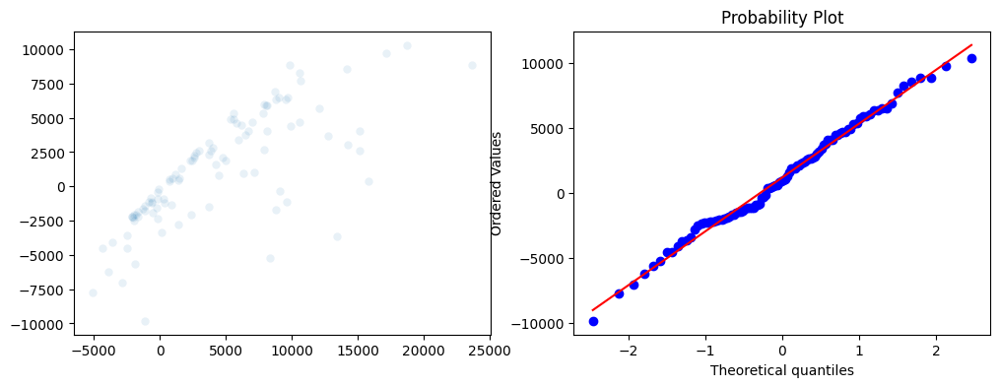

In [256]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Dispersión
sns.scatterplot(x=pipeline_num.predict(X_train_num), y=errors, alpha=0.1, ax=axes[0])

# q-q plot
_ = stats.probplot(errors, dist="norm", plot=axes[1])

Se que que los errores de este nuevo modelo que no toma en cuenta los outliers se acerca un poco más a una distribución normal de errores.